Importar librerias basicas#

In [4]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore') # Para evitar los molestos avisos.
%matplotlib inline

In [5]:
df_test = pd.read_csv('C:/Users/JOSELUIS153/OneDrive/Documentos/Maestria en analita de datos/Machine_learning/Parcial/data_teste_dv_df_2011.csv')
df_traing = pd.read_csv('C:/Users/JOSELUIS153/OneDrive/Documentos/Maestria en analita de datos/Machine_learning/Parcial/data_treino_dv_df_2000_2010.csv')

In [13]:
df_traing_trans = pd.read_csv('C:/Users/JOSELUIS153/OneDrive/Documentos/Maestria en analita de datos/Machine_learning/Parcial/train_transaction.csv')
df_traing_iden = pd.read_csv('C:/Users/JOSELUIS153/OneDrive/Documentos/Maestria en analita de datos/Machine_learning/Parcial/train_identity.csv')

In [8]:
df_test.head(5)

,HORA (UTC),"VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))","VENTO, VELOCIDADE HORARIA (m/s)",UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C),TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C),"UMIDADE RELATIVA DO AR, HORARIA (%)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)","PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)","VENTO, RAJADA MAXIMA (m/s)",PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)
0,00:00,-0.309017,3.4,95.0,94.0,19.4,19.2,95.0,881.8,0.0,5.8,881.8,881.0
1,01:00,-0.438371,2.2,95.0,93.0,19.3,19.2,93.0,882.4,0.0,5.6,882.4,881.7
2,02:00,-0.224951,3.0,95.0,93.0,19.3,19.1,95.0,882.7,0.0,5.6,882.7,882.4
3,03:00,-0.766044,3.7,97.0,95.0,19.1,18.1,96.0,882.6,6.0,7.9,882.9,882.6
4,04:00,-0.422618,2.4,97.0,96.0,18.2,17.7,96.0,882.0,3.0,6.7,882.6,882.0


In [9]:
df_traing.head(5)

,HORA (UTC),"VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))","VENTO, VELOCIDADE HORARIA (m/s)",UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C),TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C),"UMIDADE RELATIVA DO AR, HORARIA (%)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)","PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)","VENTO, RAJADA MAXIMA (m/s)",PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)
0,12:00,0.809017,1.8,69.0,60.0,22.6,20.7,61.0,888.2,0.0,3.8,888.2,887.7
1,13:00,0.965926,2.7,62.0,55.0,24.2,22.5,55.0,888.4,0.0,4.7,888.4,888.2
2,14:00,0.891007,2.0,56.0,50.0,25.5,24.3,51.0,888.1,0.0,4.9,888.4,888.1
3,15:00,0.848048,2.5,52.0,44.0,27.4,25.0,44.0,887.4,0.0,5.8,888.1,887.4
4,16:00,0.224951,2.4,50.0,43.0,27.1,25.5,46.0,886.5,0.0,5.8,887.4,886.5


In [23]:
df_traing_trans.head(5)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
df_traing.columns

Index(['HORA (UTC)', 'VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))',
       'VENTO, VELOCIDADE HORARIA (m/s)',
       'UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)',
       'UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)',
       'TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)',
       'TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)',
       'UMIDADE RELATIVA DO AR, HORARIA (%)',
       'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)',
       'PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)', 'VENTO, RAJADA MAXIMA (m/s)',
       'PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)',
       'PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)'],
      dtype='object')

In [11]:
df_test.columns

Index(['HORA (UTC)', 'VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))',
       'VENTO, VELOCIDADE HORARIA (m/s)',
       'UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)',
       'UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)',
       'TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)',
       'TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)',
       'UMIDADE RELATIVA DO AR, HORARIA (%)',
       'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)',
       'PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)', 'VENTO, RAJADA MAXIMA (m/s)',
       'PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)',
       'PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)'],
      dtype='object')

Cambio de nombre de columnas# df_test

In [14]:
df_test.rename(columns={
            'VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))':'VIENTO, DIRECCION HORARIA',
            'TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)':'TEMPERATURA MAX POR HORA',
            'TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)':'TEMPERATURA MIN POR HORA',
            'PRECIPITAÃ¯Â¿Â½Ã¯Â¿Â½O TOTAL, HORÃ¯Â¿Â½RIO (mm)':'PRECIPITACION TOTAL POR HORA',
            'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO':'PRES ATM DE ESTACION',
            'PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)':'PRECIPITACION TOTAL POR HORA',
            'PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)':'PESS ATM MAX POR HORA',
            'PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)':'PRESS ATM MIN POR HORA'
            
            },inplace=True)


In [15]:
print(df_test)

     HORA (UTC)  VIENTO, DIRECCION HORARIA  VENTO, VELOCIDADE HORARIA (m/s)  \
0         00:00                  -0.309017                              3.4   
1         01:00                  -0.438371                              2.2   
2         02:00                  -0.224951                              3.0   
3         03:00                  -0.766044                              3.7   
4         04:00                  -0.422618                              2.4   
...         ...                        ...                              ...   
8721      19:00                  -0.669131                              4.1   
8722      20:00                  -0.309017                              6.1   
8723      21:00                  -0.629320                              4.8   
8724      22:00                  -0.438371                              3.3   
8725      23:00                  -0.529919                              2.8   

      UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)  \
0

CAmbio de nombre de columnas# df_training

In [16]:
df_traing.rename(columns={
            'VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))':'VIENTO, DIRECCION HORARIA',
            'TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)':'TEMPERATURA MAX POR HORA',
            'TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)':'TEMPERATURA MIN POR HORA',
            'PRECIPITAÃ¯Â¿Â½Ã¯Â¿Â½O TOTAL, HORÃ¯Â¿Â½RIO (mm)':'PRECIPITACION TOTAL POR HORA',
            'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO':'PRES ATM DE ESTACION',
            'PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)':'PRECIPITACION TOTAL POR HORA',
            'PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)':'PESS ATM MAX POR HORA',
            'PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)':'PRESS ATM MIN POR HORA'
            },inplace=True)

Cambio de columnas variables de fraude 

In [18]:
df_test.describe()

,"VIENTO, DIRECCION HORARIA","VENTO, VELOCIDADE HORARIA (m/s)",UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),TEMPERATURA MAX POR HORA,TEMPERATURA MIN POR HORA,"UMIDADE RELATIVA DO AR, HORARIA (%)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",PRECIPITACION TOTAL POR HORA,"VENTO, RAJADA MAXIMA (m/s)",PESS ATM MAX POR HORA,PRESS ATM MIN POR HORA
count,8726.000000,8726.000000,8726.000000,8726.000000,8726.000000,8726.000000,8726.000000,8726.000000,8726.000000,8726.000000,8726.000000,8726.000000
mean,0.385537,2.502498,69.524181,63.281802,21.762996,20.400172,66.419780,886.480380,0.152601,5.440694,886.722209,886.236993
std,0.680687,1.197581,21.876372,22.299149,3.743706,3.522769,22.165285,2.409938,1.043402,2.317930,2.388294,2.418736
min,-1.000000,0.100000,11.000000,10.000000,11.200000,10.000000,11.000000,878.800000,0.000000,0.600000,878.900000,878.700000
25%,-0.224951,1.600000,54.000000,46.000000,19.000000,18.100000,50.000000,884.800000,0.000000,3.600000,885.100000,884.500000
50%,0.743145,2.400000,74.000000,65.000000,21.100000,19.800000,69.000000,886.500000,0.000000,5.400000,886.800000,886.300000
75%,0.961262,3.300000,89.000000,83.000000,24.700000,22.900000,86.000000,888.200000,0.000000,7.000000,888.400000,888.000000
max,1.000000,8.000000,98.000000,98.000000,33.300000,31.800000,98.000000,893.800000,28.600000,20.700000,894.000000,893.700000


In [19]:
df_traing.describe()

,"VIENTO, DIRECCION HORARIA","VENTO, VELOCIDADE HORARIA (m/s)",UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),TEMPERATURA MAX POR HORA,TEMPERATURA MIN POR HORA,"UMIDADE RELATIVA DO AR, HORARIA (%)","PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",PRECIPITACION TOTAL POR HORA,"VENTO, RAJADA MAXIMA (m/s)",PESS ATM MAX POR HORA,PRESS ATM MIN POR HORA
count,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000,87693.000000
mean,0.405810,2.466192,69.058465,63.176194,21.921264,20.684570,66.146682,887.251925,0.160907,5.161076,887.580724,886.891093
std,0.686247,1.313968,19.640222,20.166336,3.721386,3.513744,19.992327,4.012404,1.307515,2.311157,3.646750,3.564539
min,-1.000000,0.000000,12.000000,10.000000,9.200000,8.400000,10.000000,863.400000,0.000000,0.000000,865.300000,862.800000
25%,-0.156434,1.500000,54.000000,48.000000,19.200000,18.400000,51.000000,885.300000,0.000000,3.400000,885.600000,885.000000
50%,0.788011,2.400000,72.000000,64.000000,21.400000,20.200000,68.000000,887.200000,0.000000,5.000000,887.500000,886.900000
75%,0.970296,3.400000,87.000000,80.000000,24.700000,23.100000,84.000000,889.100000,0.000000,6.800000,889.300000,888.800000
max,1.000000,10.000000,100.000000,98.000000,35.300000,34.400000,99.000000,1023.500000,70.800000,24.300000,913.100000,910.900000


In [20]:
df_traing_trans.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,...,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.00000,82351.000000,82351.000000,82351.000000,82351.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027176,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,...,0.775874,721.741883,1375.783644,1014.622782,9.807015,59.16455,28.530903,55.352422,151.160542,100.700882
std,1.704744e+05,0.183755,4.617224e+06,239.162522,4901.170153,157.793246,11.336444,41.244453,101.741072,2.690623,...,4.727971,6217.223583,11169.275702,7955.735482,243.861391,387.62948,274.576920,668.486833,1095.034387,814.946722
min,2.987000e+06,0.000000,8.640000e+04,0.251000,1000.000000,100.000000,100.000000,100.000000,100.000000,10.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,3.134635e+06,0.000000,3.027058e+06,43.321000,6019.000000,214.000000,150.000000,166.000000,204.000000,87.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,3.282270e+06,0.000000,7.306528e+06,68.769000,9678.000000,361.000000,150.000000,226.000000,299.000000,87.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
75%,3.429904e+06,0.000000,1.124662e+07,125.000000,14184.000000,512.000000,150.000000,226.000000,330.000000,87.000000,...,0.000000,0.000000,25.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
max,3.577539e+06,1.000000,1.581113e+07,31937.391000,18396.000000,600.000000,231.000000,237.000000,540.000000,102.000000,...,55.000000,160000.000000,160000.000000,160000.000000,55125.000000,55125.00000,55125.000000,104060.000000,104060.000000,104060.000000


Conteo de datos faltantes

In [21]:
test_NA = df_test.isna().sum()
train_NA = df_traing.isna().sum()
df_traing_trans_NA = df_traing_trans.isna().sum()

In [22]:
pd.concat([df_traing_trans_NA, train_NA, test_NA], axis=1, sort = False, keys = ['Test NA', 'Train NA', 'All NA'])

,Test NA,Train NA,All NA
TransactionID,0.0,NaN,NaN
isFraud,0.0,NaN,NaN
TransactionDT,0.0,NaN,NaN
TransactionAmt,0.0,NaN,NaN
ProductCD,0.0,NaN,NaN
...,...,...,...
"PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",NaN,0.0,0.0
PRECIPITACION TOTAL POR HORA,NaN,0.0,0.0
"VENTO, RAJADA MAXIMA (m/s)",NaN,0.0,0.0
PESS ATM MAX POR HORA,NaN,0.0,0.0


In [30]:
porcentaje_NA_train_trans = ((df_traing_trans.isnull().sum() / len(df_traing_trans))*100).sort_values(ascending = False)
print(porcentaje_NA_train_trans)

dist2            93.628374
D7               93.409930
D13              89.509263
D14              89.469469
D12              89.041047
                   ...    
C1                0.000000
C2                0.000000
C14               0.000000
isFraud           0.000000
TransactionID     0.000000
Length: 394, dtype: float64


In [33]:
labels = (df_traing_trans['isFraud'].value_counts())
labels

isFraud
0    569877
1     20663
Name: count, dtype: int64

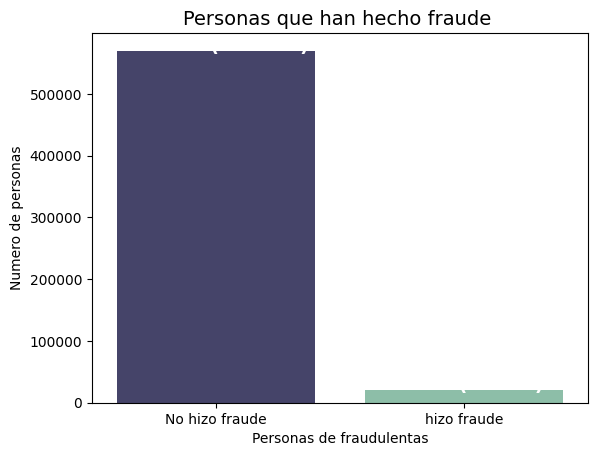

In [46]:
ax = sns.countplot(x = 'isFraud', data = df_traing_trans, palette=["#3f3e6fd1", "#85c6a9"])
plt.xticks(np.arange(2), ['No hizo fraude', 'hizo fraude'])
plt.title('Personas que han hecho fraude ',fontsize= 14)
plt.xlabel('Personas de fraudulentas')
plt.ylabel('Numero de personas');

total_count = len(df_traing_trans)
fraud_counts = df_traing_trans['isFraud'].value_counts()
fraud_percentages = (fraud_counts / total_count) * 100

# Agregar los porcentajes a la gráfica
for i, v in enumerate(fraud_counts):
    ax.text(i, v - 40, f'{v} ({fraud_percentages[i]:.2f}%)', horizontalalignment='center', size=14, color='w', fontweight='bold')

plt.show()

In [40]:
df_traing_trans['isFraud'].value_counts(normalize = True)

isFraud
0    0.96501
1    0.03499
Name: proportion, dtype: float64

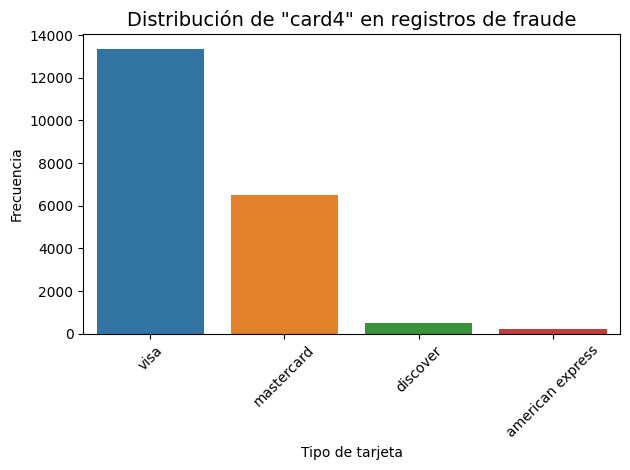

In [55]:
df_fraud = df_traing_trans[df_traing_trans["isFraud"] == 1]


sns.countplot(data=df_fraud, x="card4")
plt.title('Distribución de "card4" en registros de fraude', fontsize=14)
plt.xlabel('Tipo de tarjeta')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

Como muestra el grafico la tarjeta con mayor munero de fraude es la tarjeta Visa

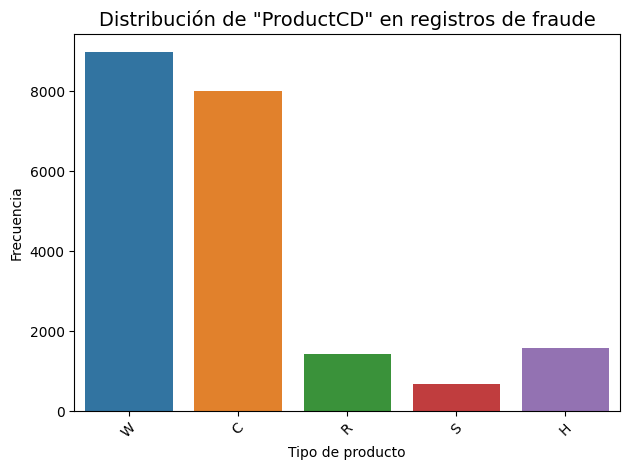

In [56]:
sns.countplot(data=df_fraud, x="ProductCD")
plt.title('Distribución de "ProductCD" en registros de fraude', fontsize=14)
plt.xlabel('Tipo de producto')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

Se puede inferir que el producto que se ha hecho mas fraude es el "W" el cual tiene mas de 8000 veces ha sido por fraude,
seguido por el producto "C"

In [59]:
card4_type = pd.DataFrame(df_traing_trans['card4'].describe())
card4_type.transpose()


,count,unique,top,freq
card4,588963,4,visa,384767


In [60]:
card4_type_product = pd.DataFrame(df_traing_trans['ProductCD'].describe())
card4_type_product.transpose()

,count,unique,top,freq
ProductCD,590540,5,W,439670


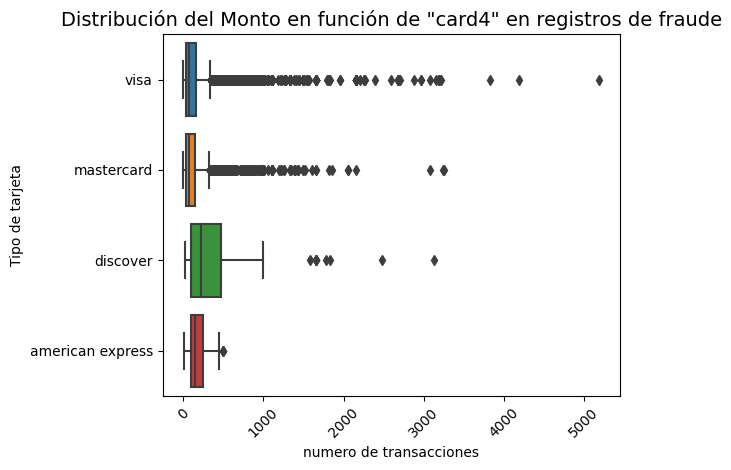

In [82]:
sns.boxplot(data=df_fraud, x="TransactionAmt", y="card4" )
plt.title('Distribución del Monto en función de "card4" en registros de fraude', fontsize=14)
plt.xlabel('numero de transacciones')
plt.ylabel('Tipo de tarjeta')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()


In [83]:
pd.DataFrame(df_traing_trans.groupby('isFraud')['TransactionAmt'].describe())

# de las tarjetas que han hecho fraude han hecho entre 68.5 y 120 transacciones

,count,mean,std,min,25%,50%,75%,max
isFraud,,,,,,,,
0,569877.0,134.511665,239.395078,0.251,43.970,68.5,120.0,31937.391
1,20663.0,149.244779,232.212163,0.292,35.044,75.0,161.0,5191.000


In [90]:
df_fraud[df_fraud['TransactionAmt'] == max(df_fraud['TransactionAmt'] )]


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
422708,3409708,1,10701442,5191.0,W,9500,321.0,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Eliminar columas con un lumbrar del 75% de la tabla df_traing_trans

In [92]:

porcentaje_nulos = (df_traing_trans.isnull().sum() / len(df_traing_trans)) * 100


columnas_a_eliminar = porcentaje_nulos[porcentaje_nulos > 75].index


df_traing_trans_sin_nulls = df_traing_trans.drop(columns=columnas_a_eliminar)



Eliminar columas con un lumbrar del 75% de la tabla df_traing_inden

In [95]:
porcentaje_nulos = (df_traing_trans.isnull().sum() / len(df_traing_iden)) * 100

columnas_a_eliminar = porcentaje_nulos[porcentaje_nulos > 75].index

df_traing_inde_sin_nulls = df_traing_trans.drop(columns=columnas_a_eliminar)

Creacion de Merge

In [96]:
df_merge = pd.merge(df_traing_trans_sin_nulls,df_traing_inde_sin_nulls,on="TransactionID",how="left")

In [98]:
df_traing_trans_sin_nulls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590540 entries, 0 to 590539
Columns: 226 entries, TransactionID to V321
dtypes: float64(209), int64(4), object(13)
memory usage: 1018.2+ MB


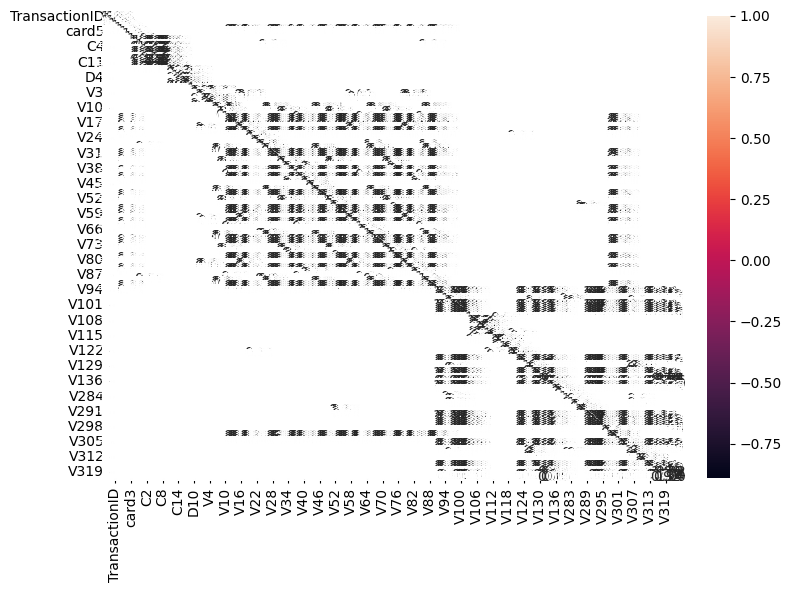

In [103]:

columnas_numericas = df_traing_trans_sin_nulls.select_dtypes(include=['float64', 'int64'])

corr_numericas = columnas_numericas.corr()

f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(corr_numericas, annot=True, linewidths=1.5, fmt='.2f', ax=ax)
plt.show()



Ejercicio # 6

In [43]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics


ModuleNotFoundError: No module named 'missingno'

In [47]:
df_traing = pd.read_csv('C:/Users/JOSELUIS153/OneDrive/Documentos/Maestria en analita de datos/Machine_learning/Parcial/data_treino_dv_df_2000_2010.csv')

In [48]:
df_traing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87693 entries, 0 to 87692
Data columns (total 13 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   HORA (UTC)                                             87693 non-null  object 
 1   VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))             87693 non-null  float64
 2   VENTO, VELOCIDADE HORARIA (m/s)                        87693 non-null  float64
 3   UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)               87693 non-null  float64
 4   UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)               87693 non-null  float64
 5   TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)         87693 non-null  float64
 6   TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)         87693 non-null  float64
 7   UMIDADE RELATIVA DO AR, HORARIA (%)                    87693 non-null  float64
 8   PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORAR

In [10]:
df_traing.rename(columns={
            'VIENTO, DIRECCION HORARIA':'DIRECCION VIENTO POR HORA',
            'VENTO, DIREï¿½ï¿½O HORARIA (gr) (ï¿½ (gr))':'DIRECCION DEL VIENTE HORARIA',
            'VENTO, VELOCIDADE HORARIA (m/s)':'VEL_VIENTO',
            'TEMPERATURA Mï¿½XIMA NA HORA ANT. (AUT) (ï¿½C)':'TEMPERATURA MAX POR HORA',
            'TEMPERATURA Mï¿½NIMA NA HORA ANT. (AUT) (ï¿½C)':'TEMPERATURA MIN POR HORA',
            'PRECIPITAÃ¯Â¿Â½Ã¯Â¿Â½O TOTAL, HORÃ¯Â¿Â½RIO (mm)':'PRECIPITACION TOTAL POR HORA',
            'PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO':'PRES ATM DE ESTACION',
            'PRECIPITAï¿½ï¿½O TOTAL, HORï¿½RIO (mm)':'PRECIPITACION TOTAL POR HORA',
            'PRESSï¿½O ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB)':'PESS ATM MAX POR HORA',
            'PRESSï¿½O ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB)':'PRESS ATM MIN POR HORA'
            },inplace=True)

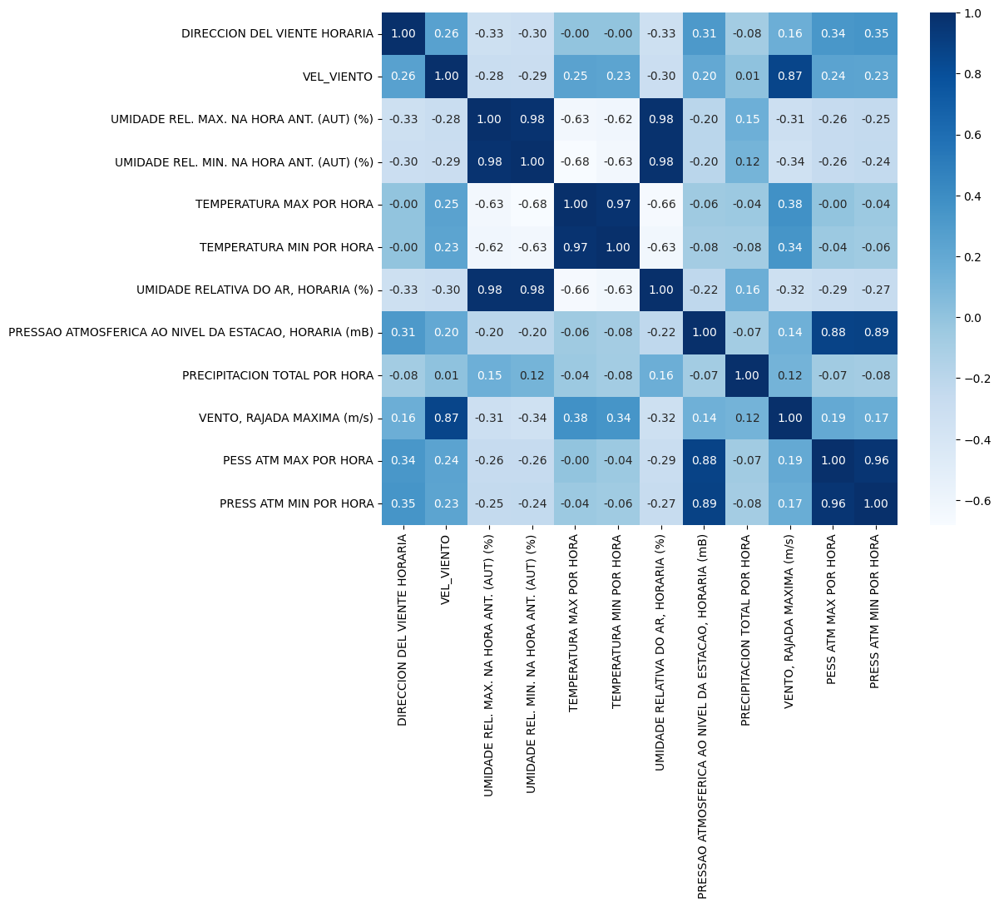

In [46]:
df_traing_numeric = df_traing.select_dtypes(include=['number'])

correlation_matrix = df_traing_numeric.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f") 


plt.show()


In [37]:
X = df_traing.drop(['DIRECCION DEL VIENTE HORARIA'], axis=1)
y = df_traing['DIRECCION DEL VIENTE HORARIA']

In [38]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=123)

print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (58754, 11) (58754,)
Testing dataset shape: (28939, 11) (28939,)


In [39]:

lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
lin_pred = lin_reg.predict(X_test)

print('MAE:', metrics.mean_absolute_error(y_test, lin_pred))
print('MSE:', metrics.mean_squared_error(y_test, lin_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lin_pred)))

MAE: 0.4814674875791198
MSE: 0.3502281153426537
RMSE: 0.5918007395590628


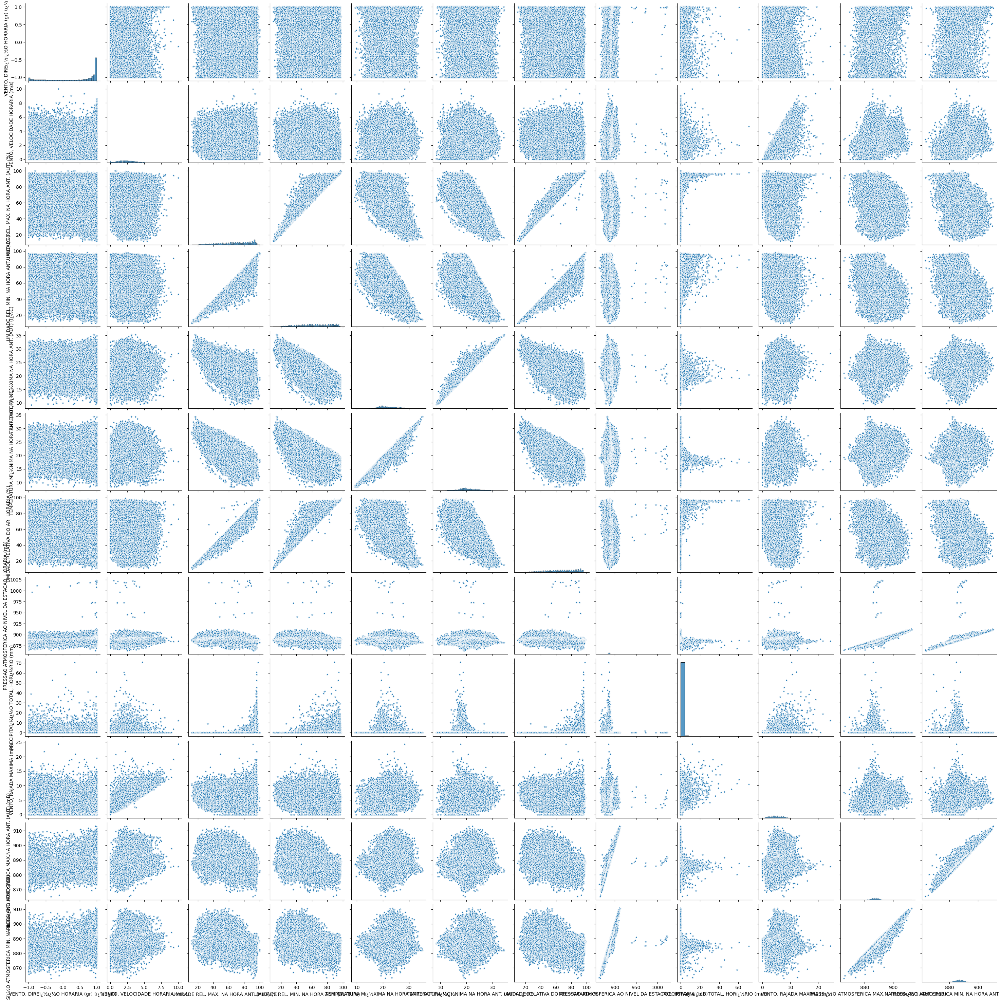

In [49]:
import seaborn as sns
sns.pairplot(df_traing, markers='*')